# Quick Bite
Regularly measuring calorie intake presents significant challenges for the average consumer due to several factors. Accurately assessing portion sizes, interpreting nutritional labels, and accounting for the composition of meals, particularly in restaurant settings or with homemade recipes, can be complex and prone to error. Many food items lack readily accessible or clear calorie information, making estimation difficult and often leading to inaccuracies. Furthermore, the process of consistently monitoring and recording food consumption requires substantial effort and attention, which can become mentally taxing and time-intensive. While digital tools and applications may assist with tracking, they still demand active user input and adherence, contributing to the perceived burden of routine calorie monitoring.

In [1]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import ultralytics
import shutil
import os

from ultralytics import YOLO
from IPython.display import display, Image
from roboflow import Roboflow

# YOLOv8 for Classification - Pretrained
model = YOLO('yolov8x-cls.pt') 
ultralytics.checks()

Ultralytics YOLOv8.2.101  Python-3.11.7 torch-2.3.1+cpu CPU (AMD Ryzen 7 4800H with Radeon Graphics)
Setup complete  (16 CPUs, 15.4 GB RAM, 430.8/453.6 GB disk)


In [2]:
!nvidia-smi

Fri Sep 27 18:07:46 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 546.80                 Driver Version: 546.80       CUDA Version: 12.3     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 3050 ...  WDDM  | 00000000:01:00.0 Off |                  N/A |
| N/A   41C    P8               6W /  95W |    103MiB /  4096MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
%cd "C:\Users\wilpo\OneDrive\Documents\MIDS\w210"

C:\Users\wilpo\OneDrive\Documents\MIDS\w210


In [4]:
rf      = Roboflow(api_key="HL90ltxw8PtUBSWjVavv")
project = rf.workspace("quickbite-njdqj").project("food-classification-rtszh")
version = project.version(4)
dataset = version.download("folder")

loading Roboflow workspace...
loading Roboflow project...


In [5]:
# !yolo task=classify mode=train model=yolov8x-cls.pt data={dataset.location} epochs=100 imgsz=128
# !yolo task=classify mode=train model=yolov8x-cls.pt data={dataset.location} epochs=5 imgsz=128
!yolo task=classify mode=train model=yolov8x-cls.pt data={dataset.location} epochs=50 imgsz=128

New https://pypi.org/project/ultralytics/8.2.102 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.101 🚀 Python-3.11.7 torch-2.3.1+cpu CPU (AMD Ryzen 7 4800H with Radeon Graphics)
engine\trainer: task=classify, mode=train, model=yolov8x-cls.pt, data=C:\Users\wilpo\OneDrive\Documents\MIDS\w210\Food-Classification-4, epochs=50, time=None, patience=100, batch=16, imgsz=128, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train15, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, cl


train: Scanning C:\Users\wilpo\OneDrive\Documents\MIDS\w210\Food-Classification-4\train... 16740 images, 0 corrupt: 100%|██████████| 16740/16740 [00:00<?, ?it/s]
train: Scanning C:\Users\wilpo\OneDrive\Documents\MIDS\w210\Food-Classification-4\train... 16740 images, 0 corrupt: 100%|██████████| 16740/16740 [00:00<?, ?it/s]

val: Scanning C:\Users\wilpo\OneDrive\Documents\MIDS\w210\Food-Classification-4\val... 1263 images, 0 corrupt: 100%|██████████| 1263/1263 [00:00<?, ?it/s]
val: Scanning C:\Users\wilpo\OneDrive\Documents\MIDS\w210\Food-Classification-4\val... 1263 images, 0 corrupt: 100%|██████████| 1263/1263 [00:00<?, ?it/s]

  0%|          | 0/1047 [00:00<?, ?it/s]
       1/50         0G      3.431         16        128:   0%|          | 0/1047 [00:03<?, ?it/s]
       1/50         0G      3.431         16        128:   0%|          | 1/1047 [00:03<1:02:49,  3.60s/it]
       1/50         0G      3.331         16        128:   0%|          | 1/1047 [00:06<1:02:49,  3.60s/it]
       1

In [21]:
!yolo task=classify mode=val model="C:/Users/wilpo/OneDrive/Documents/MIDS/w210/runs/classify/train15/weights/best.pt" data={dataset.location}

Ultralytics YOLOv8.2.101 🚀 Python-3.11.7 torch-2.3.1+cpu CPU (AMD Ryzen 7 4800H with Radeon Graphics)
YOLOv8x-cls summary (fused): 133 layers, 56,155,225 parameters, 0 gradients, 153.8 GFLOPs
train: C:\Users\wilpo\OneDrive\Documents\MIDS\w210\Food-Classification-4\train... found 16740 images in 25 classes ✅ 
val: C:\Users\wilpo\OneDrive\Documents\MIDS\w210\Food-Classification-4\val... found 1263 images in 25 classes ✅ 
test: C:\Users\wilpo\OneDrive\Documents\MIDS\w210\Food-Classification-4\test... found 1263 images in 25 classes ✅ 
                   all      0.694      0.917
Speed: 0.0ms preprocess, 25.6ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to runs\classify\val5
💡 Learn more at https://docs.ultralytics.com/modes/val



val: Scanning C:\Users\wilpo\OneDrive\Documents\MIDS\w210\Food-Classification-4\val... 1263 images, 0 corrupt: 100%|██████████| 1263/1263 [00:00<?, ?it/s]
val: Scanning C:\Users\wilpo\OneDrive\Documents\MIDS\w210\Food-Classification-4\val... 1263 images, 0 corrupt: 100%|██████████| 1263/1263 [00:00<?, ?it/s]

               classes   top1_acc   top5_acc: 100%|██████████| 79/79 [00:42<00:00,  1.84it/s]


In [27]:
import os
import requests
from inference_sdk import InferenceHTTPClient

# Initialize the InferenceHTTPClient
CLIENT = InferenceHTTPClient(
    api_url="https://classify.roboflow.com",
    api_key="HL90ltxw8PtUBSWjVavv"
)

def classify_image(image_path):
    # Use the inference client to classify the image
    result = CLIENT.infer(image_path, model_id="food-classification-rtszh/4")
    return result

In [26]:
project.version(dataset.version).deploy(model_type="yolov8-cls", model_path=f"C:/Users/wilpo/OneDrive/Documents/MIDS/w210/runs/classify/train15/")

Dependency ultralytics==8.0.196 is required but found version=8.2.101, to fix: `pip install ultralytics==8.0.196`


SystemExit: 1

In [29]:
df_images = r"C:\Users\wilpo\OneDrive\Documents\MIDS\w210\df_eda.csv"
keep_list = r"C:\Users\wilpo\OneDrive\Documents\MIDS\w210\keep.csv"

df_keep = pd.read_csv(keep_list)
df_imgs = pd.read_csv(df_images)

df_keep = df_keep[df_keep['Validate']=='TRUE']
df_keep = df_keep.merge(df_imgs, how='left', left_on='category_name', right_on='category_name')

In [30]:
df_keep_val = df_keep.copy()
df_val = pd.read_csv(r"C:\Users\wilpo\OneDrive\Documents\MIDS\w210\ifood-2019-fgvc6\val_labels.csv")
df_val_keep = df_val[df_val['label'].isin(df_keep_val['label'].unique())]
df_val_keep.head()

,img_name,label
1818,val_000006.jpg,201
1820,val_000008.jpg,19
1825,val_000013.jpg,0
1827,val_000015.jpg,201
1831,val_000019.jpg,29


In [52]:
# Validation
df_val_keep['image_path'] = 'C:/Users/wilpo/OneDrive/Documents\MIDS/w210/ifood-2019-fgvc6/images/upload_val/' + df_val_keep['img_name']
val_list = df_val_keep['image_path'].to_list()

for img in val_list:
    predictions = classify_image(img)
    for prediction in predictions['predictions']:
        class_name = prediction['class']
        confidence = prediction['confidence']
        df_val_keep.loc[df_val_keep['image_path'] == img, class_name] = confidence

df_val_keep.head()

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,img_name,label,image_path,grilled_cheese_sandwich,boiled_egg,apple_pie,burrito,cannoli,chocolate_mousse,churro,...,ice_cream,lasagna,linguine,macaron,macaroni_and_cheese,onion_rings,pancake,panna_cotta,risotto,tempura
1818,val_000006.jpg,201,C:/Users/wilpo/OneDrive/Documents\MIDS/w210/if...,0.1016,0.0375,0.0374,0.0374,0.0374,0.0374,0.0374,...,0.0374,0.0374,0.0374,0.0374,0.0374,0.0374,0.0374,0.0374,0.0374,0.0374
1820,val_000008.jpg,19,C:/Users/wilpo/OneDrive/Documents\MIDS/w210/if...,0.0374,0.0374,0.0374,0.0374,0.1017,0.0374,0.0374,...,0.0374,0.0374,0.0374,0.0374,0.0374,0.0374,0.0374,0.0374,0.0374,0.0374
1825,val_000013.jpg,0,C:/Users/wilpo/OneDrive/Documents\MIDS/w210/if...,0.0379,0.0753,0.0379,0.0380,0.0379,0.0379,0.0380,...,0.0380,0.0379,0.0379,0.0381,0.0379,0.0380,0.0379,0.0380,0.0379,0.0379
1827,val_000015.jpg,201,C:/Users/wilpo/OneDrive/Documents\MIDS/w210/if...,0.0925,0.0376,0.0376,0.0382,0.0376,0.0376,0.0376,...,0.0376,0.0411,0.0376,0.0376,0.0376,0.0376,0.0376,0.0376,0.0376,0.0376
1831,val_000019.jpg,29,C:/Users/wilpo/OneDrive/Documents\MIDS/w210/if...,0.0375,0.0375,0.0980,0.0375,0.0375,0.0390,0.0375,...,0.0375,0.0375,0.0375,0.0375,0.0375,0.0375,0.0375,0.0375,0.0375,0.0375


In [54]:
# Assuming class columns are all columns except 'image_path' and 'label'
class_columns = df_val_keep.columns.difference(['img_name','image_path', 'label'])

# Create a new column for the most confident label
df_val_keep['most_confident_label'] = df_val_keep[class_columns].idxmax(axis=1)

# Optional: Create a new column for the corresponding confidence value
df_val_keep['most_confident_value'] = df_val_keep[class_columns].max(axis=1)

# Save the updated DataFrame to a new CSV file if needed
df_val_keep.to_csv('updated_predictions_with_most_confident_label.csv', index=False)

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [56]:
# Class list
class_list_path = r"C:\Users\wilpo\OneDrive\Documents\MIDS\w210\ifood-2019-fgvc6\class_list.txt"
class_mapping = {}

# Open the file and read the contents
with open(class_list_path, 'r') as file:
    lines = file.readlines()
    for line in lines:
        # Split each line by space to separate the index and the class name
        index, class_name = line.strip().split(' ', 1)
        # Convert the index to an integer and add the mapping to the dictionary
        class_mapping[int(index)] = class_name

In [58]:
df_val_keep['class_name'] = df_val_keep['label'].map(class_mapping)

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [60]:
df_val_keep.to_csv('validation_set_results.csv')

In [61]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, ConfusionMatrixDisplay

In [62]:
y_true = df_val_keep['class_name']  # True labels
y_pred = df_val_keep['most_confident_label']  # Predicted labels

accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred, average='weighted', zero_division=0)
recall = recall_score(y_true, y_pred, average='weighted', zero_division=0)
f1 = f1_score(y_true, y_pred, average='weighted', zero_division=0)

In [63]:
# Print the metrics
print(f'Accuracy: {accuracy:.4f}')
print(f'Precision: {precision:.4f}')
print(f'Recall: {recall:.4f}')
print(f'F1 Score: {f1:.4f}')

Accuracy: 0.6073
Precision: 0.6325
Recall: 0.6073
F1 Score: 0.6048


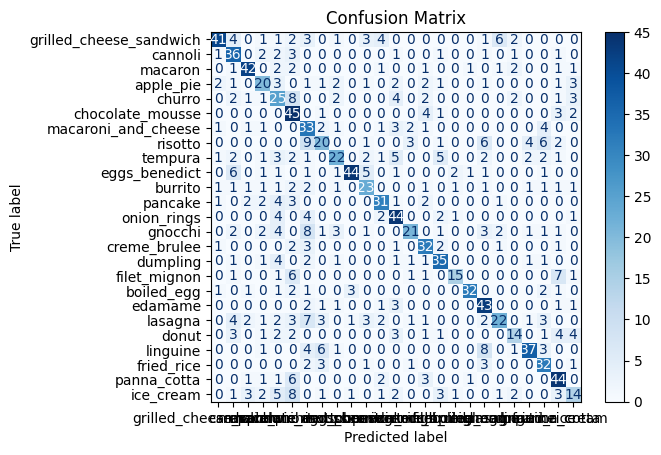

In [64]:
# Create the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred, labels=y_true.unique())

# Display the confusion matrix
cm_display = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=y_true.unique())
cm_display.plot(cmap='Blues')
plt.title('Confusion Matrix')
plt.show()

In [64]:
df_val_keep['filepath'] = "C:/Users/wilpo/OneDrive/Documents/MIDS/w210/ifood-2019-fgvc6/val_set/val_set/" + df_val_keep['img_name']
# df_val_keep = df_val_keep.sort_values(by='label', ascending=True)
# df_val_keep.reset_index(drop=True, inplace=True)
class_mapping_df = pd.DataFrame(list(class_mapping.items()), columns=['label', 'category_name'])
df_val_keep = df_val_keep.merge(class_mapping_df, on='label', how='left')
df_val_keep


# val_imgs = df_val_keep['filepath'].to_list()
# dst_folder = r"C:\Users\wilpo\OneDrive\Documents\MIDS\w210\ifood-2019-fgvc6\images\upload_val"
# for file in val_imgs:
#     file_name = os.path.basename(file)
#     print(file_name)
#     dst_path  = os.path.join(dst_folder, file_name)
#     shutil.move(file, dst_path)

C:\Users\wilpo\AppData\Local\Temp\ipykernel_21616\2136439625.py:5: FutureWarning: Passing 'suffixes' which cause duplicate columns {'category_name_x'} in the result is deprecated and will raise a MergeError in a future version.
  df_val_keep = df_val_keep.merge(class_mapping_df, on='label', how='left')


,img_name,label,filepath,category_name_x,category_name_y,category_name_x,category_name_y,category_name_x,category_name_y,category_name_x,category_name_y,category_name_x,category_name_y
0,val_003487.jpg,0,C:/Users/wilpo/OneDrive/Documents/MIDS/w210/if...,macaron,macaron,macaron,macaron,macaron,macaron,macaron,macaron,macaron,macaron
1,val_007611.jpg,0,C:/Users/wilpo/OneDrive/Documents/MIDS/w210/if...,macaron,macaron,macaron,macaron,macaron,macaron,macaron,macaron,macaron,macaron
2,val_003678.jpg,0,C:/Users/wilpo/OneDrive/Documents/MIDS/w210/if...,macaron,macaron,macaron,macaron,macaron,macaron,macaron,macaron,macaron,macaron
3,val_003605.jpg,0,C:/Users/wilpo/OneDrive/Documents/MIDS/w210/if...,macaron,macaron,macaron,macaron,macaron,macaron,macaron,macaron,macaron,macaron
4,val_003603.jpg,0,C:/Users/wilpo/OneDrive/Documents/MIDS/w210/if...,macaron,macaron,macaron,macaron,macaron,macaron,macaron,macaron,macaron,macaron
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1258,val_008490.jpg,201,C:/Users/wilpo/OneDrive/Documents/MIDS/w210/if...,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich
1259,val_000967.jpg,201,C:/Users/wilpo/OneDrive/Documents/MIDS/w210/if...,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich
1260,val_009709.jpg,201,C:/Users/wilpo/OneDrive/Documents/MIDS/w210/if...,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich
1261,val_006759.jpg,201,C:/Users/wilpo/OneDrive/Documents/MIDS/w210/if...,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich,grilled_cheese_sandwich


In [66]:
df_val_keep.to_csv('poop_val.csv')

In [ ]:
# train_imgs = df_keep['filepath'].to_list()
# dst_folder = r"C:\Users\wilpo\OneDrive\Documents\MIDS\w210\ifood-2019-fgvc6\images\upload"
# for file in train_imgs:
#     file_name = os.path.basename(file)
#     dst_path  = os.path.join(dst_folder, file_name)
#     shutil.move(file, dst_path)

In [2]:
# Train the model
train_params = {
    'data'        : r"C:\Users\wilpo\OneDrive\Documents\MIDS\w210\data.yaml",   # Path to your data.yaml file
    'epochs'      : 50,                                                         # Number of epochs
    'batch'       : 32,                                                         # Batch size
    'imgsz'       : 640,                                                        # Image size for training
    'lr0'         : 0.01,                                                       # Initial learning rate
    'momentum'    : 0.937,                                                      # Momentum
    'weight_decay': 0.0005,                                                     # Weight decay
    'patience'    : 50,                                                         # Patience for early stopping
}

model.train(**train_params)

Ultralytics YOLOv8.2.99  Python-3.11.7 torch-2.3.1+cpu CPU (AMD Ryzen 7 4800H with Radeon Graphics)
engine\trainer: task=classify, mode=train, model=yolov8x-cls.pt, data=C:\Users\wilpo\OneDrive\Documents\MIDS\w210\data.yaml, epochs=50, time=None, patience=50, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=

RuntimeError: Dataset 'C://Users/wilpo/OneDrive/Documents/MIDS/w210/data.yaml' error    Download failure for https://ultralytics.com/assets/C://Users/wilpo/OneDrive/Documents/MIDS/w210/data.yaml.zip. Retry limit reached.

In [ ]:
results = model.val()  # Validate the model

### Dataset 
Data Src: https://github.com/karansikka1/iFood_2019?tab=readme-ov-file

Dataset to 251 fine-grained (prepared) food categories with 118,475 training images collected from the web. We provide human verified labels for both the validation set of 11,994 images and the test set of 28,377 images. 

In [ ]:
# Class list
class_list_path = r"C:\Users\wilpo\OneDrive\Documents\MIDS\w210\ifood-2019-fgvc6\class_list.txt"
class_mapping = {}

# Open the file and read the contents
with open(class_list_path, 'r') as file:
    lines = file.readlines()
    for line in lines:
        # Split each line by space to separate the index and the class name
        index, class_name = line.strip().split(' ', 1)
        # Convert the index to an integer and add the mapping to the dictionary
        class_mapping[int(index)] = class_name

In [ ]:
# Reduce classes after EDA process
keep_list = r"C:\Users\wilpo\OneDrive\Documents\MIDS\w210\keep.csv"
df_keep = pd.read_csv(keep_list)
df_keep = df_keep[df_keep['Validate']=='TRUE']
print("Classes to train for :", len(df_keep))
classes_to_keep = df_keep['category_name'].tolist()

In [ ]:
# Convert to an array of label IDs for classes to keep
filtered_class_mapping = {index: class_name for index, class_name in class_mapping.items() if class_name in classes_to_keep}
print("Filtered class mapping:", len(filtered_class_mapping))
filtered_class_ids = list(map(str, filtered_class_mapping.keys()))

In [ ]:
filtered_class_mapping.values()

In [ ]:
# Check "bad" input test data
type_1_data = pd.read_csv(r"C:\Users\wilpo\OneDrive\Documents\MIDS\w210\df_eda.csv")
type_1_data = type_1_data[(type_1_data['is_cartoon'] == False) & (type_1_data['has_face'] == False) & (type_1_data['is_media_art'] == False) & (type_1_data['has_text'] == False)]
type_1_data = type_1_data['img_name'].to_list()

In [ ]:
# Paths to the dataset
train_dir = r"C:\Users\wilpo\OneDrive\Documents\MIDS\w210\ifood-2019-fgvc6\train_set\train_set"
val_dir   = r"C:\Users\wilpo\OneDrive\Documents\MIDS\w210\ifood-2019-fgvc6\val_set\val_set"
test_dir  = r"C:\Users\wilpo\OneDrive\Documents\MIDS\w210\ifood-2019-fgvc6\test_set\test_set"

# Path to the labels
df_train = pd.read_csv(r"C:\Users\wilpo\OneDrive\Documents\MIDS\w210\ifood-2019-fgvc6\train_labels.csv")
df_val   = pd.read_csv(r"C:\Users\wilpo\OneDrive\Documents\MIDS\w210\ifood-2019-fgvc6\val_labels.csv")

# TypeError: If class_mode="categorical", y_col="label" column values must be type string, list or tuple.
df_train['label'] = df_train['label'].astype(str)
df_val['label']   = df_val['label'].astype(str)

# Filter datasets to just classifications of interest
df_train = df_train[df_train['label'].isin(filtered_class_ids)]
df_train = df_train[df_train['img_name'].isin(type_1_data)]
df_val   = df_val[df_val['label'].isin(filtered_class_ids)]

In [ ]:
# Hyperparameters
n_classes             = len(filtered_class_mapping) # Used to be class_mapping before dropping classes
img_width, img_height = 224, 224 # Required to be a 'square' for MobileNetv2
nb_train_samples      = df_train.shape[0]
nb_validation_samples = df_val.shape[0]
batch_size            = 64

### Generators
Docs : https://www.tensorflow.org/api_docs/python/tf/keras/preprocessing/image/ImageDataGenerator

In [ ]:
train_datagen = ImageDataGenerator(
    rescale          = 1. / 255,   # Rescales the pixel values of the images to be in the range [0, 1] (from the original [0, 255]).
    shear_range      = 0.2,        # Randomly applies shearing transformations to the images with a shear intensity of 0.2.
    zoom_range       = 0.1,        # Randomly zooms in on images by up to 10% to make the model more robust to scale variations.
    horizontal_flip  = True,       # Randomly flips images horizontally to augment the dataset and improve generalization.
    rotation_range   = 30,         # Rotate images randomly within a range of 30 degrees
)

In [ ]:
val_datagen = ImageDataGenerator(
    rescale          = 1. / 255,   # Rescales the pixel values of the images to be in the range [0, 1] (from the original [0, 255]).
    shear_range      = 0.2,        # Randomly applies shearing transformations to the images with a shear intensity of 0.2.
    zoom_range       = 0.1,        # Randomly zooms in on images by up to 10% to make the model more robust to scale variations.
    horizontal_flip  = True,       # Randomly flips images horizontally to augment the dataset and improve generalization.
    rotation_range   = 30,         # Rotate images randomly within a range of 30 degrees
)

In [ ]:
test_datagen = ImageDataGenerator(rescale=1. / 255)

In [ ]:
train_generator = train_datagen.flow_from_dataframe(
    df_train,
    x_col       = 'img_name',
    y_col       = 'label',   
    directory   = train_dir,
    target_size = (img_height, img_width),
    batch_size  = batch_size,
    class_mode  = 'categorical',
    shuffle     = True,
    subset      = 'training'
)

In [ ]:
validation_generator = val_datagen.flow_from_dataframe(
    df_val,
    x_col       = 'img_name',
    y_col       = 'label',   
    directory   = val_dir,
    target_size = (img_height, img_width),
    batch_size  = batch_size,
    class_mode  = 'categorical',
    shuffle     = False,
)

In [ ]:
# test_generator = test_datagen.flow_from_directory(
#     test_dir,
#     target_size=(img_height, img_width),
#     batch_size=batch_size,
#     class_mode='categorical',
#     shuffle=False  # No shuffling for test data
# )

## Create the Model
Set up the architecture and parameters

In [ ]:
pretrained_model = tf.keras.applications.MobileNetV2(
    input_shape  = (img_height, img_width, 3),
    include_top  = False,
    weights      = 'imagenet',
    pooling      = 'avg'
    )

pretrained_model.trainable = True

In [ ]:
inputs  = pretrained_model.input
x       = tf.keras.layers.Dense(128, activation='relu')(pretrained_model.output)
x       = tf.keras.layers.Dense(128, activation='relu')(x)
outputs = tf.keras.layers.Dense(n_classes, activation='softmax')(x)
model   = tf.keras.Model(inputs, outputs)
print(model.summary())

In [ ]:
# # Load the InceptionV3 model, pre-trained on ImageNet
# base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))
# # base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))
# base_model.trainable = True

In [ ]:
# model = Sequential([
#     # Data Augmentation Layers
#     RandomFlip('horizontal'),
#     RandomRotation(0.1),

#     # Pre-trained model (feature extractor)
#     base_model,

#     # GlobalAveragePooling2D directly after the pre-trained model
#     GlobalAveragePooling2D(),

#     # Adding fully connected layers
#     Dense(8, activation='relu'),
#     Dropout(0.5),
    
#     # Dense(128, activation='relu'),
#     # Dropout(0.5),

#     Dense(n_classes, activation='softmax')  # Assuming you're using categorical crossentropy
# ])

In [ ]:
model.compile(optimizer = Adam(learning_rate=0.0001),  # Learning rate can be tuned
              loss      = 'categorical_crossentropy',
              metrics   = ['accuracy', tf.keras.metrics.AUC(name='auc')])

early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
reduce_lr      = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=10, min_lr=0.000001)

## Train the Model

In [ ]:
history = model.fit(
    train_generator,
    steps_per_epoch  = nb_train_samples // batch_size,
    epochs           = 100,  # Number of epochs to fine-tune
    validation_data  = validation_generator,
    validation_steps = nb_validation_samples // batch_size,
    callbacks        = [early_stopping, reduce_lr]
)

# Some of the pretrained models on 1 epoch
# InceptionV3 : 0.0053
# VGG16       : 0.0052
# Xception    : 0.0049
# DenseNet121 : 0.0017
# MobileNetV2 : 0.0038

In [ ]:
acc      = history.history['accuracy']
val_acc  = history.history['val_accuracy']
loss     = history.history['loss']
val_loss = history.history['val_loss']
epochs   = range(1, len(acc) + 1)

plt.figure(figsize=(12, 5))

# Plot training and validation accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs, acc, label='Training Accuracy')
plt.plot(epochs, val_acc, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(epochs, loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
# Play with model
image_path = r"C:\Users\wilpo\OneDrive\Documents\MIDS\w210\TEST_IMAGES\beef_stew\image_11.jpg"  # Replace with the path to your image
img = mpimg.imread(image_path)

plt.imshow(img)
plt.axis('off')  # Turn off axis labels
plt.show()

img = load_img(image_path, target_size=(img_height, img_width))

# Preprocess the image to be compatible with the model
img_array = img_to_array(img)  # Convert image to array
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
img_array /= 255.  # Normalize the image

predictions = model.predict(img_array)
predicted_class_index = np.argmax(predictions, axis=1)[0]
predicted_class_label = class_mapping[predicted_class_index]
print(predicted_class_label)

In [ ]:
# import json

# # Load the .ipynb file
# with open('eat.ipynb', 'r', encoding='utf-8') as f:
#     notebook = json.load(f)

# # Extract code cells
# code_cells = [cell['source'] for cell in notebook['cells'] if cell['cell_type'] == 'code']

# # Write the code to a .py file
# with open('output.py', 'w', encoding='utf-8') as f:
#     for cell in code_cells:
#         f.write(''.join(cell) + '\n\n')